# **Geospatial Clustering Project**

In [1]:
!pip install -q folium pydeck plotly seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 42.4 MB/s eta 0:00:00


In [2]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import HeatMap, MarkerCluster
import pydeck as pdk
from datetime import datetime

In [5]:
df = pd.read_csv('/content/data.csv', parse_dates=["Order_Date"], low_memory=False)
print("Rows, Columns:", df.shape)
df.head()

Rows, Columns: (1340, 16)


,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,order_value_INR,delivery_time_minutes,status,distance_km,_approx_place,place_type
0,ORD0001,DP0018,35,3.7,19.187136,73.253706,19.143831,73.147786,2024-08-18,14:41:57,595.0,45.0,Delivered,12.122,Mumbai,Metro
1,ORD0002,DP0370,23,3.6,28.422697,76.942452,28.391331,76.811696,2024-12-01,14:44:44,381.0,56.0,Delivered,13.256,Delhi,Metro
2,ORD0003,DP0099,26,4.3,13.142132,77.765237,13.194121,77.882152,2024-11-19,19:01:41,661.0,54.0,Delivered,13.916,Bengaluru,Metro
3,ORD0004,DP0378,38,5.0,12.915568,77.669159,13.013351,77.675551,2024-03-17,20:02:52,1220.0,50.0,Delivered,10.895,Bengaluru,Metro
4,ORD0005,DP0305,22,4.4,18.658715,73.765779,18.751649,73.714412,2025-04-27,22:40:52,357.0,38.0,Delivered,11.664,Pune,Metro


In [6]:
# 2. Quick cleaning & types
# -------------------------
# Ensure numeric fields are numeric
for col in ["order_value_INR", "delivery_time_minutes", "Delivery_person_Ratings", "Delivery_person_Age", "distance_km"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

In [7]:
# Standardize column names (optional)
df.columns = [c.strip() for c in df.columns]

In [8]:
# Extract time features
df["Order_Hour"] = pd.to_datetime(df["Time_Orderd"], format="%H:%M:%S", errors="coerce").dt.hour
df["Order_Weekday"] = df["Order_Date"].dt.day_name()
df["Order_DOW"] = df["Order_Date"].dt.weekday  # 0 Mon - 6 Sun
df["is_weekend"] = df["Order_DOW"].isin([5,6])

In [9]:
# Quick null check
print("Null counts:\n", df.isna().sum().sort_values(ascending=False).head(10))

Null counts:
 delivery_time_minutes          72
ID                              0
Delivery_person_Age             0
Delivery_person_ID              0
Delivery_person_Ratings         0
Restaurant_latitude             0
Delivery_location_latitude      0
Restaurant_longitude            0
Delivery_location_longitude     0
Order_Date                      0
dtype: int64


In [10]:
# 3. Numeric summary / univariate EDA
# -------------------------
# Summary stats
num_cols = ["order_value_INR", "delivery_time_minutes", "Delivery_person_Ratings", "Delivery_person_Age", "distance_km"]
display(df[num_cols].describe().T)

,count,mean,std,min,25%,50%,75%,max
order_value_INR,1340.0,499.941791,428.969061,40.000,233.00000,384.000,624.2500,6000.000
delivery_time_minutes,1268.0,34.522871,15.831451,4.000,22.00000,32.000,46.0000,93.000
Delivery_person_Ratings,1340.0,4.172090,0.550901,2.200,3.80000,4.200,4.6000,5.000
Delivery_person_Age,1340.0,32.105970,5.841122,18.000,29.00000,32.000,36.0000,52.000
distance_km,1340.0,8.674203,3.649755,0.256,5.76325,9.002,11.5915,15.024


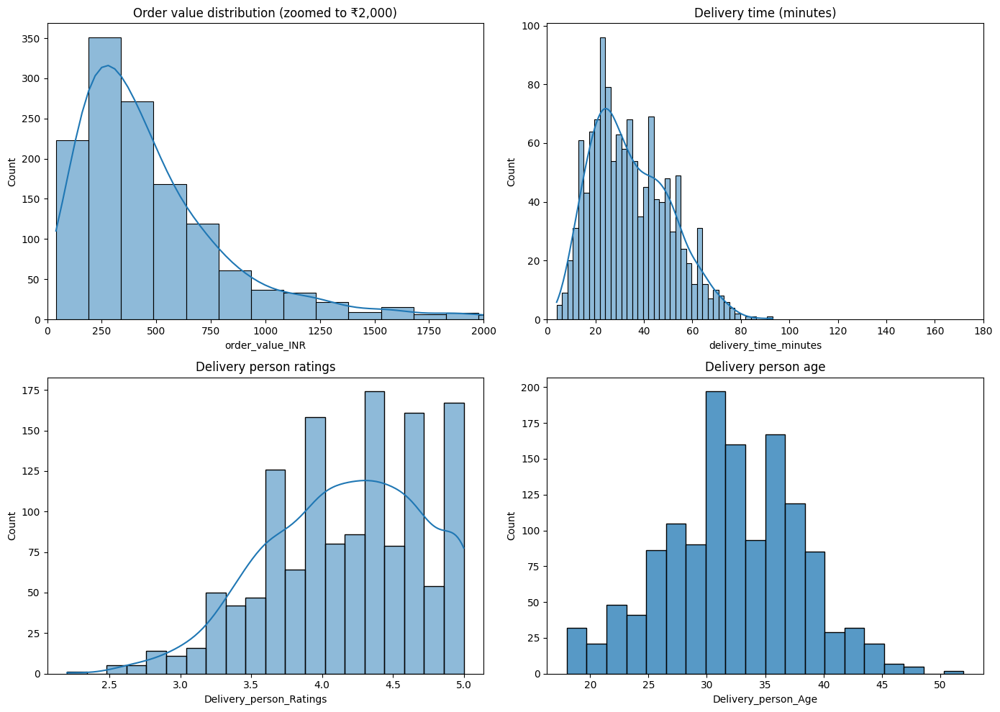

In [11]:
# Histograms (high quality)
plt.figure(figsize=(14,10))
plt.subplot(2,2,1)
sns.histplot(df["order_value_INR"].dropna(), bins=40, kde=True)
plt.xlim(0, 2000)
plt.title("Order value distribution (zoomed to ₹2,000)")

plt.subplot(2,2,2)
sns.histplot(df["delivery_time_minutes"].dropna(), bins=40, kde=True)
plt.xlim(0, 180)
plt.title("Delivery time (minutes)")

plt.subplot(2,2,3)
sns.histplot(df["Delivery_person_Ratings"].dropna(), bins=20, kde=True)
plt.title("Delivery person ratings")

plt.subplot(2,2,4)
sns.histplot(df["Delivery_person_Age"].dropna(), bins=20, kde=False)
plt.title("Delivery person age")
plt.tight_layout()
plt.show()

/tmp/ipython-input-4174182362.py:6: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(order_vals, labels=df["place_type"].unique())
/tmp/ipython-input-4174182362.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(dt_vals, labels=df["place_type"].unique())


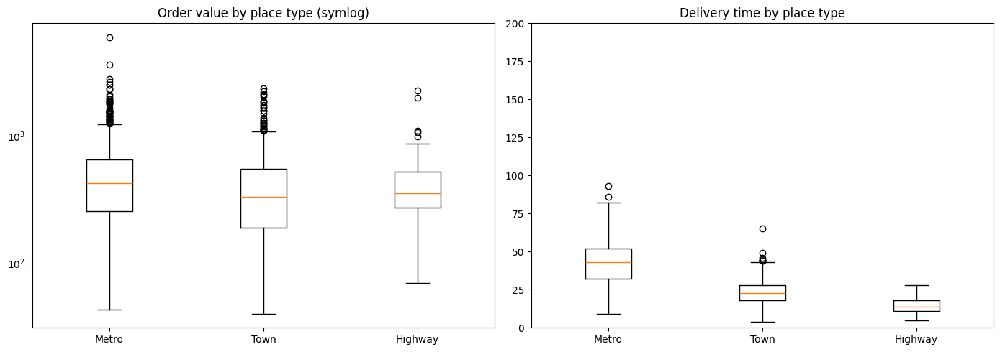

In [12]:
# Boxplots by place_type
if "_approx_place" in df.columns and "place_type" in df.columns:
    plt.figure(figsize=(14,5))
    plt.subplot(1,2,1)
    order_vals = [df.loc[df["place_type"]==pt, "order_value_INR"].dropna() for pt in df["place_type"].unique()]
    plt.boxplot(order_vals, labels=df["place_type"].unique())
    plt.yscale("symlog", linthresh=1)
    plt.title("Order value by place type (symlog)")

    plt.subplot(1,2,2)
    dt_vals = [df.loc[df["place_type"]==pt, "delivery_time_minutes"].dropna() for pt in df["place_type"].unique()]
    plt.boxplot(dt_vals, labels=df["place_type"].unique())
    plt.ylim(0,200)
    plt.title("Delivery time by place type")
    plt.tight_layout()
    plt.show()

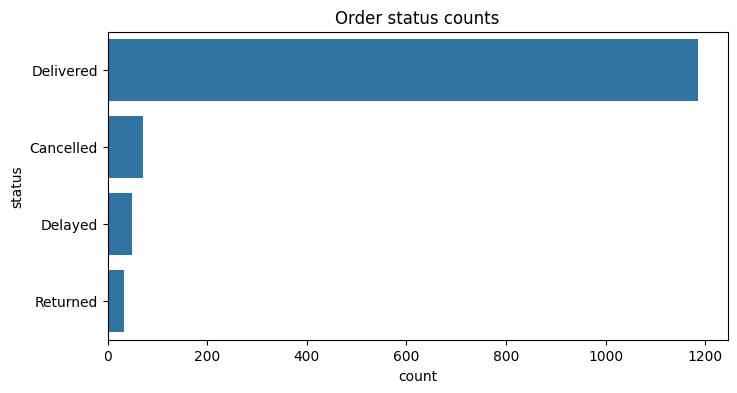

In [13]:
# Status distribution
plt.figure(figsize=(8,4))
sns.countplot(y="status", data=df, order=df["status"].value_counts().index)
plt.title("Order status counts")
plt.show()

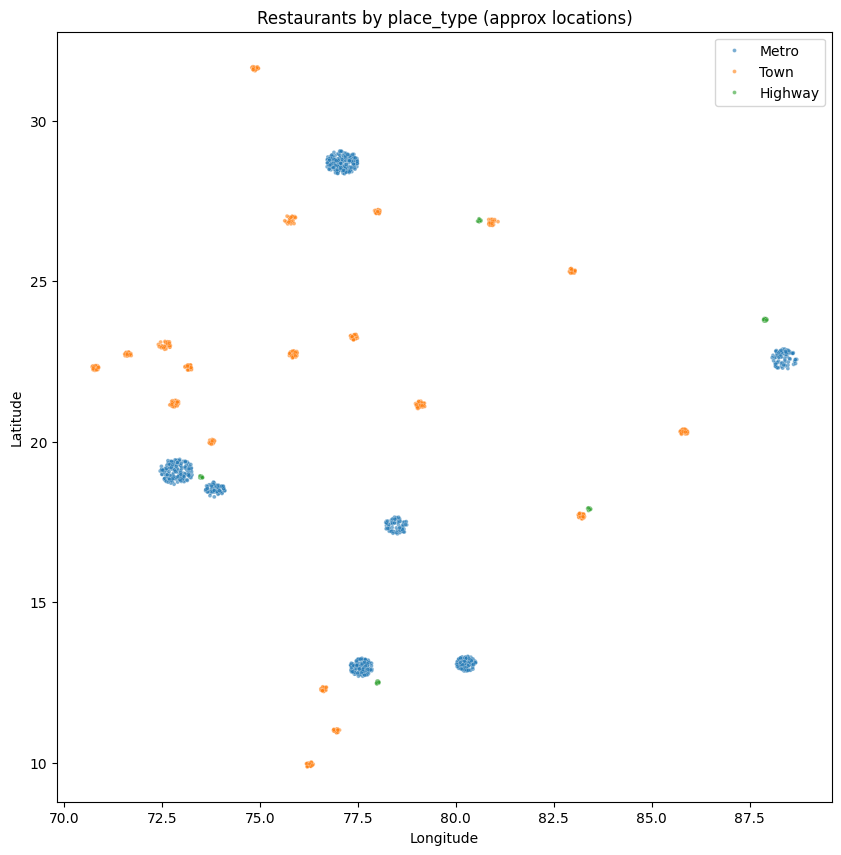

In [14]:
# 4. Geographic sanity-check visuals (static)
# -------------------------
# Scatter of restaurants (restaurant_longitude vs latitude)
plt.figure(figsize=(10,10))
sns.scatterplot(x="Restaurant_longitude", y="Restaurant_latitude", hue="place_type", data=df, s=8, alpha=0.6)
plt.title("Restaurants by place_type (approx locations)")
plt.xlabel("Longitude"); plt.ylabel("Latitude")
plt.legend()
plt.show()

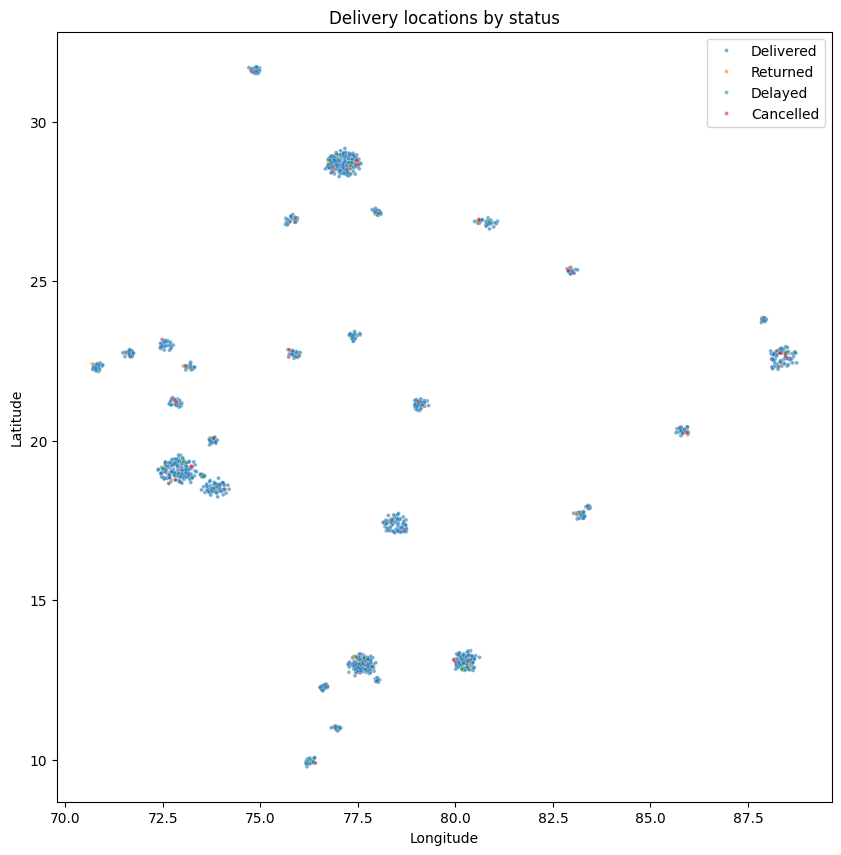

In [15]:
# Scatter of delivery points colored by status
plt.figure(figsize=(10,10))
sns.scatterplot(x="Delivery_location_longitude", y="Delivery_location_latitude", hue="status", data=df, s=8, alpha=0.6)
plt.title("Delivery locations by status")
plt.xlabel("Longitude"); plt.ylabel("Latitude")
plt.legend()
plt.show()

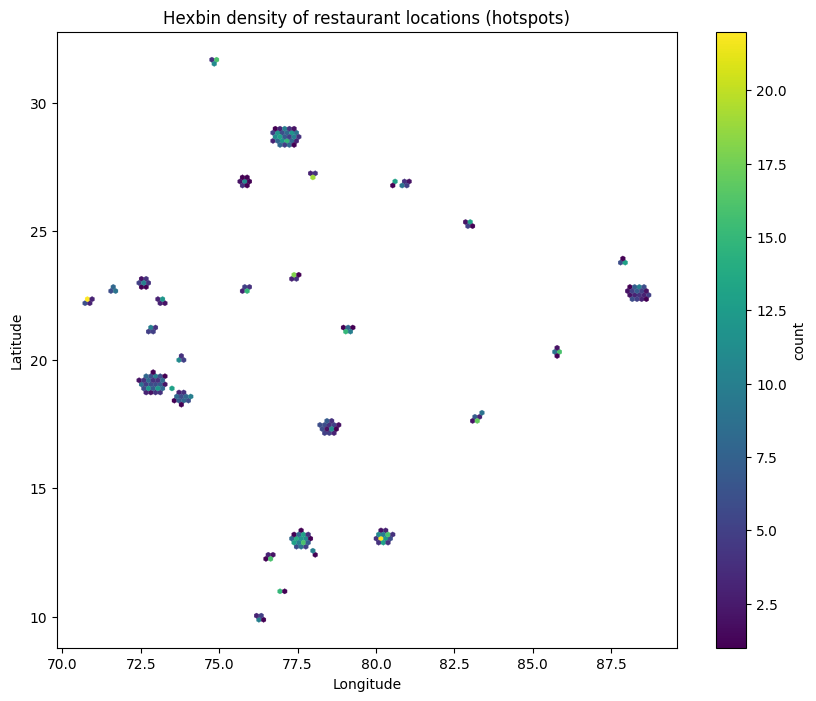

In [16]:
# Hexbin density - restaurants
plt.figure(figsize=(10,8))
plt.hexbin(df["Restaurant_longitude"], df["Restaurant_latitude"], gridsize=120, mincnt=1, linewidths=0.2)
plt.title("Hexbin density of restaurant locations (hotspots)")
plt.xlabel("Longitude"); plt.ylabel("Latitude")
cb = plt.colorbar(); cb.set_label("count")
plt.show()

In [17]:
# 5. Interactive map: Folium (good for pinpoint + marker clusters + heatmap)
# -------------------------
# Center map on India approx
map_center = [df["Restaurant_latitude"].mean(), df["Restaurant_longitude"].mean()]
m = folium.Map(location=map_center, zoom_start=5, tiles="CartoDB positron")

# Add marker cluster for restaurants (random subset if too many)
rest_subset = df[["Restaurant_latitude","Restaurant_longitude","_approx_place","order_value_INR"]].dropna().sample(min(len(df), 800), random_state=2)
marker_cluster = MarkerCluster(name="Restaurants").add_to(m)
for i,r in rest_subset.iterrows():
    folium.CircleMarker(location=[r["Restaurant_latitude"], r["Restaurant_longitude"]],
                        radius=3,
                        fill=True,
                        popup=f"{r['_approx_place']} | ₹{int(r['order_value_INR'])}",
                        fill_opacity=0.8).add_to(marker_cluster)

In [18]:
# Heatmap of deliveries
heat_data = df[["Delivery_location_latitude","Delivery_location_longitude"]].dropna().values.tolist()
HeatMap(heat_data, min_opacity=0.2, radius=8, blur=12, name="DeliveryHeat").add_to(m)

folium.LayerControl().add_to(m)
# Save and display
m.save("eda_folium_map.html")
print("Saved interactive folium map to eda_folium_map.html (download or open in a new tab).")
m  # in Colab this renders the map inline


Saved interactive folium map to eda_folium_map.html (download or open in a new tab).


In [19]:
# 6. Interactive map: pydeck (Deck.gl) - great for sophisticated layers & exports
# -------------------------
# Pydeck map with hexagon layer (server-side no-tile; works in Colab)
# Prepare a sample to keep the map responsive
sample_map = df.dropna(subset=["Delivery_location_latitude","Delivery_location_longitude"]).sample(min(1200, len(df)), random_state=1)
sample_map = sample_map.rename(columns={"Delivery_location_latitude":"lat","Delivery_location_longitude":"lon"})

hex_layer = pdk.Layer(
    "HexagonLayer",
    data=sample_map,
    get_position=["lon", "lat"],
    radius=1000,        # radius in meters
    elevation_scale=50,
    elevation_range=[0, 3000],
    pickable=True,
    extruded=True,
)

scatter_layer = pdk.Layer(
    "ScatterplotLayer",
    data=sample_map.sample(min(800, len(sample_map)), random_state=2),
    get_position=["lon","lat"],
    get_radius=50,
    get_fill_color="[200, 30, 0, 140]",
    pickable=True
)

view_state = pdk.ViewState(latitude=map_center[0], longitude=map_center[1], zoom=5, bearing=0, pitch=40)

r = pdk.Deck(layers=[hex_layer, scatter_layer], initial_view_state=view_state, tooltip={"text": "{_approx_place}\nCount: {elevationValue}"})
r.to_html("eda_pydeck_map.html")
print("Saved pydeck map to eda_pydeck_map.html (open to inspect).")
r  # renders in notebook

<IPython.core.display.Javascript object>

Saved pydeck map to eda_pydeck_map.html (open to inspect).


<IPython.core.display.Javascript object>

{
  "initialViewState": {
    "bearing": 0,
    "latitude": 20.487574711940297,
    "longitude": 77.5968486261194,
    "pitch": 40,
    "zoom": 5
  },
  "layers": [
    {
      "@@type": "HexagonLayer",
      "data": [
        {
          "Delivery_person_Age": 34,
          "Delivery_person_ID": "DP0089",
          "Delivery_person_Ratings": 4.4,
          "ID": "ORD0560",
          "Order_DOW": 2,
          "Order_Date": {},
          "Order_Hour": 12,
          "Order_Weekday": "Wednesday",
          "Restaurant_latitude": 17.498399,
          "Restaurant_longitude": 78.531011,
          "Time_Orderd": "12:50:52",
          "_approx_place": "Hyderabad",
          "delivery_time_minutes": 46.0,
          "distance_km": 11.313,
          "is_weekend": false,
          "lat": 17.458126,
          "lon": 78.433061,
          "order_value_INR": 313.0,
          "place_type": "Metro",
          "status": "Delivered"
        },
        {
          "Delivery_person_Age": 35,
          "Delivery_person_ID": "DP0150",
          "Delivery_person_Ratings": 4.8,
          "ID": "ORD1090",
          "Order_DOW": 0,
          "Order_Date": {},
          "Order_Hour": 18,
          "Order_Weekday": "Monday",
          "Restaurant_latitude": 20.057953,
          "Restaurant_longitude": 73.822896,
          "Time_Orderd": "18:43:17",
          "_approx_place": "Nashik",
          "delivery_time_minutes": 17.0,
          "distance_km": 4.746,
          "is_weekend": false,
          "lat": 20.100553,
          "lon": 73.825683,
          "order_value_INR": 256.0,
          "place_type": "Town",
          "status": "Delivered"
        },
        {
          "Delivery_person_Age": 21,
          "Delivery_person_ID": "DP0324",
          "Delivery_person_Ratings": 4.4,
          "ID": "ORD1022",
          "Order_DOW": 2,
          "Order_Date": {},
          "Order_Hour": 12,
          "Order_Weekday": "Wednesday",
          "Restaurant_latitude": 25.381237,
          "Restaurant_longitude": 82.960959,
          "Time_Orderd": "12:43:48",
          "_approx_place": "Varanasi",
          "delivery_time_minutes": 31.0,
          "distance_km": 9.632,
          "is_weekend": false,
          "lat": 25.385168,
          "lon": 82.865179,
          "order_value_INR": 190.0,
          "place_type": "Town",
          "status": "Delivered"
        },
        {
          "Delivery_person_Age": 35,
          "Delivery_person_ID": "DP0300",
          "Delivery_person_Ratings": 4.0,
          "ID": "ORD0461",
          "Order_DOW": 6,
          "Order_Date": {},
          "Order_Hour": 7,
          "Order_Weekday": "Sunday",
          "Restaurant_latitude": 13.077849,
          "Restaurant_longitude": 77.388974,
          "Time_Orderd": "07:47:43",
          "_approx_place": "Bengaluru",
          "delivery_time_minutes": 46.0,
          "distance_km": 11.66,
          "is_weekend": true,
          "lat": 13.180535,
          "lon": 77.367143,
          "order_value_INR": 1662.0,
          "place_type": "Metro",
          "status": "Delivered"
        },
        {
          "Delivery_person_Age": 45,
          "Delivery_person_ID": "DP0120",
          "Delivery_person_Ratings": 3.0,
          "ID": "ORD0803",
          "Order_DOW": 0,
          "Order_Date": {},
          "Order_Hour": 21,
          "Order_Weekday": "Monday",
          "Restaurant_latitude": 28.952908,
          "Restaurant_longitude": 77.371255,
          "Time_Orderd": "21:55:13",
          "_approx_place": "Delhi",
          "delivery_time_minutes": 21.0,
          "distance_km": 3.385,
          "is_weekend": false,
          "lat": 28.97459,
          "lon": 77.346838,
          "order_value_INR": 449.0,
          "place_type": "Metro",
          "status": "Delivered"
        },
        {
          "Delivery_person_Age": 31,
          "Delivery_person_ID": "DP0217",
          "Delivery_person_Ratings": 4.8,
          "ID": "ORD0299",
          "Order_DOW": 0,
          "Order_Date": {},

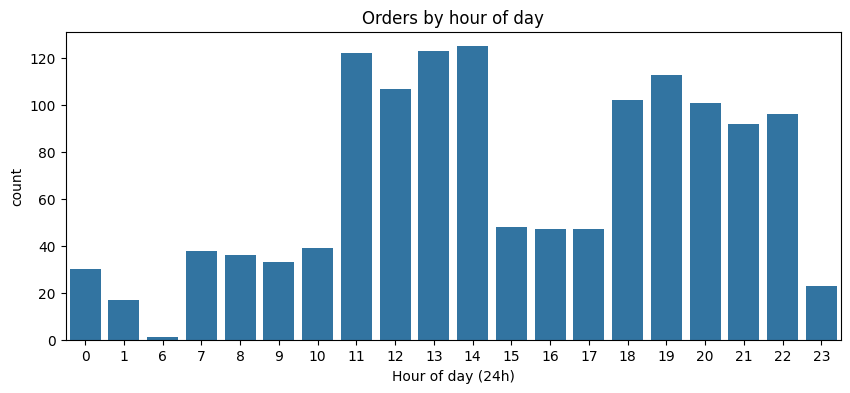

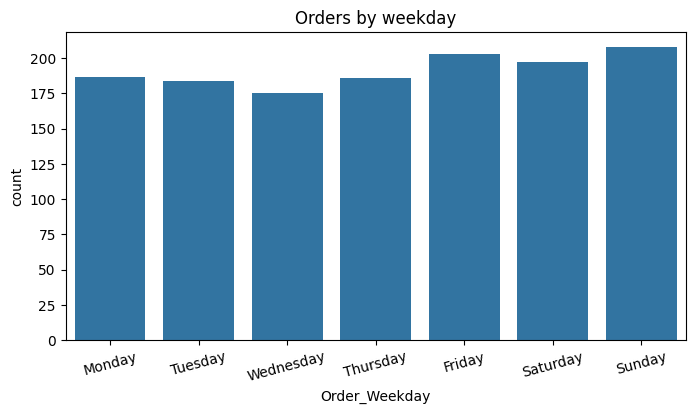

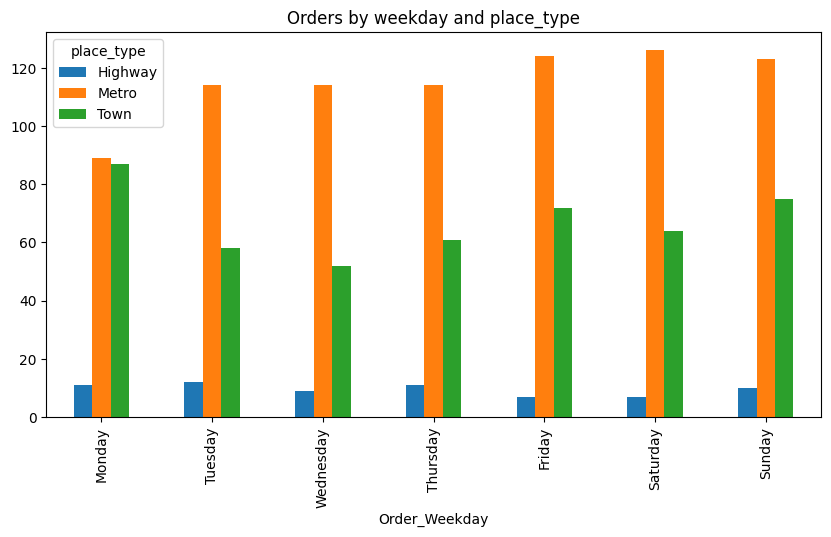

In [20]:
# 7. Time-based EDA (seasonality)
# -------------------------
# Orders by hour (diurnal pattern)
plt.figure(figsize=(10,4))
sns.countplot(x="Order_Hour", data=df, order=sorted(df["Order_Hour"].dropna().unique()))
plt.title("Orders by hour of day")
plt.xlabel("Hour of day (24h)")
plt.show()

# Weekday vs weekend
plt.figure(figsize=(8,4))
sns.countplot(x="Order_Weekday", data=df, order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"])
plt.title("Orders by weekday")
plt.xticks(rotation=15)
plt.show()

# Animated-ish: weekly seasonality by place_type (pivot table)
pivot = df.pivot_table(index="Order_Weekday", columns="place_type", values="ID", aggfunc="count").reindex(["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"])
pivot.plot(kind="bar", figsize=(10,5))
plt.title("Orders by weekday and place_type")
plt.show()

In [21]:
# 8. Feature engineering (for clustering later)
# -------------------------
# Important geospatial features:
# - Use raw lat/lon (or convert to projected coordinates / meters)
# - distance_km (already present)
# - log(order_value)
# - hour-of-day sin/cos for circular time
df["log_order_value"] = np.log1p(df["order_value_INR"].fillna(0))
df["hour_sin"] = np.sin(2 * np.pi * df["Order_Hour"].fillna(df["Order_Hour"].mode()[0]) / 24)
df["hour_cos"] = np.cos(2 * np.pi * df["Order_Hour"].fillna(df["Order_Hour"].mode()[0]) / 24)

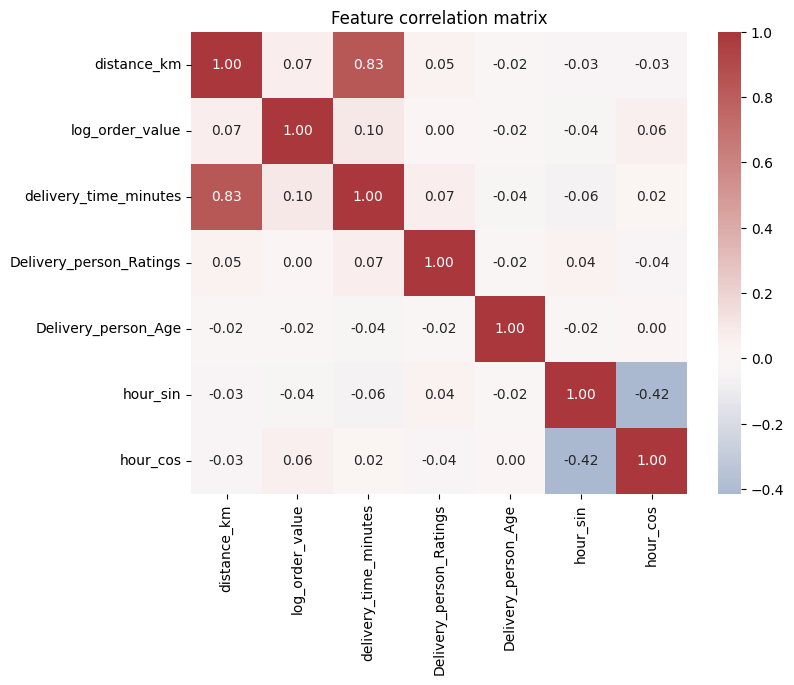

In [22]:
# If you want projected coords (meters) for accurate distance-based clustering, convert lat/lon -> EPSG:3857 with geopandas (optional)
# Example (optional):
# import geopandas as gpd
# gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Restaurant_longitude, df.Restaurant_latitude), crs="EPSG:4326")
# gdf = gdf.to_crs(epsg=3857)
# df["rest_x"] = gdf.geometry.x; df["rest_y"] = gdf.geometry.y

# -------------------------
# 9. Correlations & PCA quick check
# -------------------------
feats = ["distance_km","log_order_value","delivery_time_minutes","Delivery_person_Ratings","Delivery_person_Age","hour_sin","hour_cos"]
corr = df[feats].corr()
plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="vlag", center=0)
plt.title("Feature correlation matrix")
plt.show()

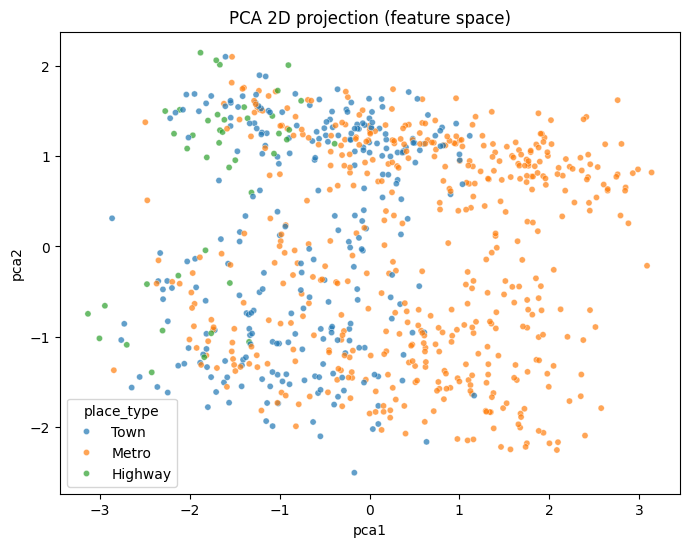

In [23]:
# PCA for 2D visual check (scaled)
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X = df[feats].fillna(0)
scaler = StandardScaler()
Xs = scaler.fit_transform(X)
pca = PCA(n_components=2, random_state=0)
pc = pca.fit_transform(Xs)
df["pca1"] = pc[:,0]; df["pca2"] = pc[:,1]

plt.figure(figsize=(8,6))
sns.scatterplot(x="pca1", y="pca2", hue="place_type", data=df.sample(min(800,len(df)), random_state=2), s=20, alpha=0.7)
plt.title("PCA 2D projection (feature space)")
plt.show()

In [24]:
# 10. Export cleaned dataset / artifacts
# -------------------------
OUT_DIR = "/content/eda_outputs"
os.makedirs(OUT_DIR, exist_ok=True)
df.to_csv(os.path.join(OUT_DIR, "india_geo_clustering_eda_prepped.csv"), index=False)
print("Saved prepared dataset to:", os.path.join(OUT_DIR, "india_geo_clustering_eda_prepped.csv"))

# Save key static figures
plt.savefig(os.path.join(OUT_DIR, "last_figure.png"), bbox_inches="tight")
print("All done. Check /content (or your Drive) for exported files and the HTML maps.")

Saved prepared dataset to: /content/eda_outputs/india_geo_clustering_eda_prepped.csv
All done. Check /content (or your Drive) for exported files and the HTML maps.


<Figure size 640x480 with 0 Axes>

In [25]:
color_map = {'Metro':'crimson', 'Town':'teal', 'Highway':'goldenrod'}

fig = go.Figure()

for place_type, color in color_map.items():
    sub = df[df['place_type'] == place_type]
    fig.add_trace(go.Scattergeo(
        lon=sub['Restaurant_longitude'],
        lat=sub['Restaurant_latitude'],
        mode='markers',
        marker=dict(color=color, size=4, opacity=0.7),
        name=place_type,
        hovertemplate='Type: '+place_type+'<br>Lat: %{lat:.3f}<br>Lon: %{lon:.3f}'
    ))

fig.update_layout(
    title='🍴 Restaurant Distribution by Place Type',
    geo=dict(
        scope='asia',
        showland=True,
        landcolor='rgb(229, 229, 229)',
        showcountries=True,
        countrycolor='rgb(200, 200, 200)',
        lonaxis=dict(range=[68, 98]),
        lataxis=dict(range=[6, 38])
    ),
    legend=dict(orientation="h", y=-0.1, x=0.3),
    margin=dict(l=0, r=0, t=60, b=0)
)

fig.show()

NameError: name 'go' is not defined

In [27]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scattergeo(
    lon=df['Delivery_location_longitude'],
    lat=df['Delivery_location_latitude'],
    mode='markers',
    marker=dict(color='royalblue', size=4, opacity=0.7),
    name='Deliveries',
    hovertemplate='Lat: %{lat:.4f}<br>Lon: %{lon:.4f}<extra>Delivery</extra>'
))

fig.update_layout(
    title='📦 Mapping Our Reach — Delivery Locations Across India',
    geo=dict(
        scope='asia',
        showland=True,
        landcolor='rgb(230, 230, 230)',
        showcountries=True,
        countrycolor='rgb(200, 200, 200)',
        showocean=True,
        oceancolor='rgb(240, 248, 255)',
        lonaxis=dict(range=[68, 98]),
        lataxis=dict(range=[6, 38]),
    ),
    margin=dict(l=0, r=0, t=60, b=0),
    showlegend=False
)

fig.show()


In [28]:
status_colors = {
    'Delivered':'#2ECC71',
    'Cancelled':'#E74C3C',
    'Delayed':'#F1C40F',
    'Returned':'#9B59B6'
}

fig = go.Figure()

for status, color in status_colors.items():
    sub = df[df['status'] == status]
    fig.add_trace(go.Scattergeo(
        lon=sub['Delivery_location_longitude'],
        lat=sub['Delivery_location_latitude'],
        mode='markers',
        marker=dict(color=color, size=5, opacity=0.65),
        name=status,
        hovertemplate=f"Status: {status}<br>Lat: %{{lat:.4f}}<br>Lon: %{{lon:.4f}}"
    ))

fig.update_layout(
    title='🚚 Delivery Outcomes Across India',
    geo=dict(
        scope='asia',
        showland=True,
        landcolor='rgb(240, 240, 240)',
        showcountries=True,
        countrycolor='rgb(200, 200, 200)',
        lonaxis=dict(range=[68, 98]),
        lataxis=dict(range=[6, 38]),
    ),
    legend=dict(orientation="h", y=-0.15, x=0.3),
    margin=dict(l=0, r=0, t=60, b=0)
)

fig.show()

In [29]:
import plotly.express as px

fig = px.density_mapbox(
    df, lat='Delivery_location_latitude', lon='Delivery_location_longitude',
    z=None, radius=8, center=dict(lat=22, lon=79), zoom=3.8,
    mapbox_style='carto-positron',
    title='🔥 Delivery Density Heatmap — India',
    opacity=0.7
)

fig.update_layout(margin=dict(l=0, r=0, t=60, b=0))
fig.show()


# **Model Building**

In [30]:
# Snippet 1: Setup & Load data
# Run once at top of notebook. Adjust DATA_PATH to where you put the CSV in Colab.

# Install extras (run in Colab if not installed)
!pip install -q xgboost lightgbm catboost hdbscan plotly folium pydeck

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (8,5)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.7 MB/s eta 0:00:00


In [31]:
# Snippet 2: Quick cleaning & feature extraction
# Ensures numeric types, fills basic fields used later, and creates time features.

# Numeric conversion
num_cols = ["order_value_INR","delivery_time_minutes","Delivery_person_Ratings","Delivery_person_Age","distance_km"]
for c in num_cols:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# Time features from Time_Orderd and Order_Date
df["Order_Hour"] = pd.to_datetime(df["Time_Orderd"], format="%H:%M:%S", errors="coerce").dt.hour
df["Order_Weekday"] = df["Order_Date"].dt.day_name()
df["Order_DOW"] = df["Order_Date"].dt.weekday
df["is_weekend"] = df["Order_DOW"].isin([5,6]).astype(int)

# Circular encoding for hour
df["Order_Hour"].fillna(df["Order_Hour"].mode()[0], inplace=True)
df["hour_sin"] = np.sin(2 * np.pi * df["Order_Hour"] / 24)
df["hour_cos"] = np.cos(2 * np.pi * df["Order_Hour"] / 24)

# Log order value
df["log_order_value"] = np.log1p(df["order_value_INR"].fillna(0))

# Quick NA handling for modeling columns (you can refine later)
df["delivery_time_minutes"].fillna(df["delivery_time_minutes"].median(), inplace=True)
df["order_value_INR"].fillna(df["order_value_INR"].median(), inplace=True)
df["distance_km"].fillna(df["distance_km"].median(), inplace=True)

# Encode place_type if exists
if "place_type" in df.columns:
    df["place_type"] = df["place_type"].fillna("Unknown")
    from sklearn.preprocessing import LabelEncoder
    le_pt = LabelEncoder()
    df["place_encoded"] = le_pt.fit_transform(df["place_type"])
else:
    df["place_encoded"] = 0

df[["Order_Hour","hour_sin","hour_cos","log_order_value","place_encoded"]].head()

/tmp/ipython-input-465639703.py:17: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipython-input-465639703.py:25: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or d

,Order_Hour,hour_sin,hour_cos,log_order_value,place_encoded
0,14,-0.500000,-0.866025,6.390241,1
1,14,-0.500000,-0.866025,5.945421,1
2,19,-0.965926,0.258819,6.495266,1
3,20,-0.866025,0.500000,7.107425,1
4,22,-0.500000,0.866025,5.880533,1


In [32]:
# Snippet 3: Prepare supervised target & feature matrix, train/test split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# Encode status target
le_status = LabelEncoder()
df["status_encoded"] = le_status.fit_transform(df["status"].astype(str))
print("Status classes:", list(le_status.classes_))

# Feature list (tweakable)
features = [
    "order_value_INR","delivery_time_minutes","distance_km",
    "Delivery_person_Ratings","Delivery_person_Age",
    "hour_sin","hour_cos","log_order_value","place_encoded"
]

X = df[features].fillna(0)
y = df["status_encoded"]

# Scale numeric features for many models
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Stratified split to preserve status distribution
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.25, random_state=42, stratify=y
)

print("Train shape:", X_train.shape, "Test shape:", X_test.shape)

Status classes: ['Cancelled', 'Delayed', 'Delivered', 'Returned']
Train shape: (1005, 9) Test shape: (335, 9)


In [33]:
# Snippet 4: Train a set of strong supervised models and get predictions
import warnings
warnings.filterwarnings("ignore")

from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# 1) Random Forest
rf = RandomForestClassifier(n_estimators=300, max_depth=10, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
print("RandomForest\n", classification_report(y_test, rf_pred, target_names=le_status.classes_))

# 2) XGBoost
xgb_clf = xgb.XGBClassifier(n_estimators=400, max_depth=8, learning_rate=0.05,
                            subsample=0.8, colsample_bytree=0.8, random_state=42, use_label_encoder=False, eval_metric="mlogloss")
xgb_clf.fit(X_train, y_train)
xgb_pred = xgb_clf.predict(X_test)
print("XGBoost\n", classification_report(y_test, xgb_pred, target_names=le_status.classes_))

# 3) LightGBM
lgb_clf = lgb.LGBMClassifier(n_estimators=400, learning_rate=0.05, num_leaves=32, random_state=42)
lgb_clf.fit(X_train, y_train)
lgb_pred = lgb_clf.predict(X_test)
print("LightGBM\n", classification_report(y_test, lgb_pred, target_names=le_status.classes_))

# 4) CatBoost
cat_clf = CatBoostClassifier(iterations=300, learning_rate=0.05, depth=8, verbose=False, random_seed=42)
cat_clf.fit(X_train, y_train)
cat_pred = cat_clf.predict(X_test)
print("CatBoost\n", classification_report(y_test, cat_pred, target_names=le_status.classes_))

RandomForest
               precision    recall  f1-score   support

   Cancelled       0.86      0.33      0.48        18
     Delayed       1.00      0.08      0.15        12
   Delivered       0.91      1.00      0.95       297
    Returned       0.00      0.00      0.00         8

    accuracy                           0.90       335
   macro avg       0.69      0.35      0.40       335
weighted avg       0.88      0.90      0.87       335

XGBoost
               precision    recall  f1-score   support

   Cancelled       0.78      0.39      0.52        18
     Delayed       1.00      0.08      0.15        12
   Delivered       0.91      0.99      0.95       297
    Returned       0.50      0.12      0.20         8

    accuracy                           0.91       335
   macro avg       0.80      0.40      0.46       335
weighted avg       0.90      0.91      0.88       335

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000479 seconds.
You

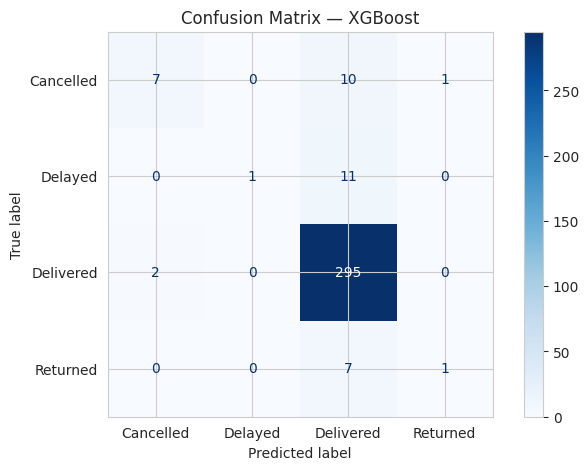

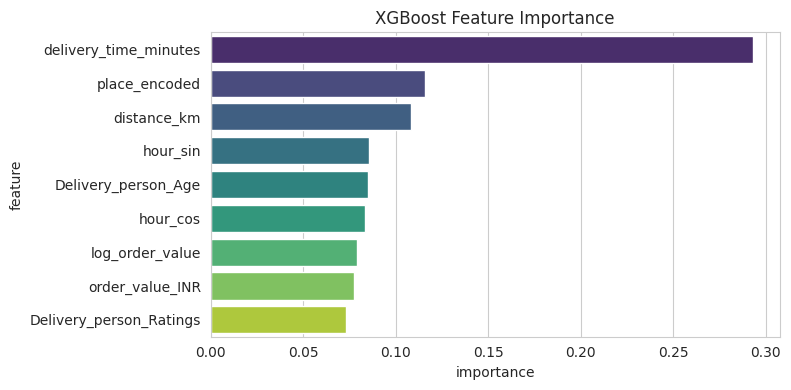

In [34]:
# Snippet 5: Confusion matrices and feature importance (XGBoost example + RF)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import ConfusionMatrixDisplay

# Confusion matrix for best model (pick XGBoost here)
best_pred = xgb_pred
ConfusionMatrixDisplay.from_predictions(y_test, best_pred, display_labels=le_status.classes_, cmap="Blues")
plt.title("Confusion Matrix — XGBoost")
plt.show()

# Feature importance (XGBoost)
fi = pd.DataFrame({"feature": features, "importance": xgb_clf.feature_importances_}).sort_values("importance", ascending=False)
plt.figure(figsize=(8,4))
sns.barplot(x="importance", y="feature", data=fi, palette="viridis")
plt.title("XGBoost Feature Importance")
plt.tight_layout()
plt.show()

# Permutation importance (optional, slower) - uncomment if you want
# from sklearn.inspection import permutation_importance
# perm = permutation_importance(xgb_clf, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)
# perm_imp = pd.DataFrame({'feature': features, 'importance': perm.importances_mean}).sort_values('importance', ascending=False)
# display(perm_imp)

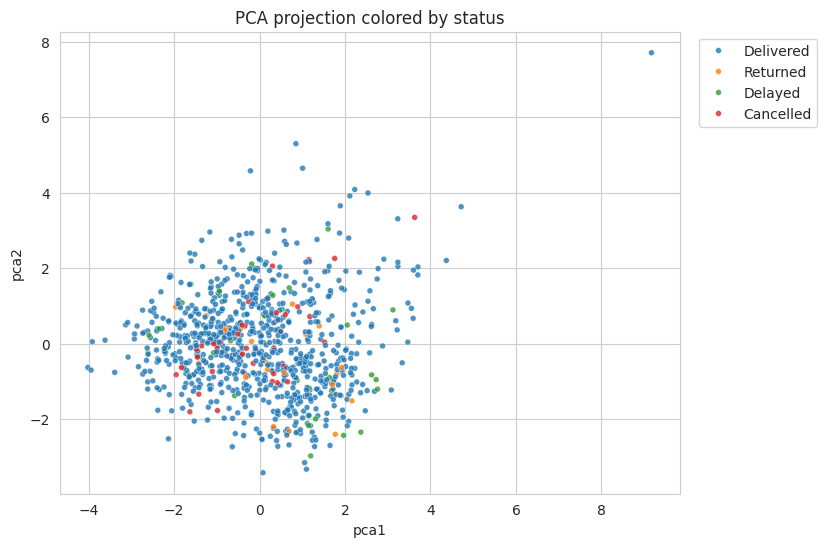

In [35]:
# Snippet 6: PCA 2D projection for visualization
from sklearn.decomposition import PCA
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)
df["pca1"] = X_pca[:,0]
df["pca2"] = X_pca[:,1]

# Plot PCA with true status labels
plt.figure(figsize=(8,6))
sns.scatterplot(x="pca1", y="pca2", hue="status", data=df.sample(min(900,len(df)), random_state=2), palette="tab10", s=18, alpha=0.8)
plt.title("PCA projection colored by status")
plt.legend(bbox_to_anchor=(1.02,1))
plt.show()

In [36]:
# Snippet 7: Unsupervised clustering (KMeans, DBSCAN, HDBSCAN)
from sklearn.cluster import KMeans, DBSCAN
import hdbscan

# KMeans (choose k empirically; start with 5)
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
df["cluster_kmeans"] = kmeans.fit_predict(X_scaled)

# DBSCAN - try eps around 1.2..2.0 (depends on scaling)
db = DBSCAN(eps=1.5, min_samples=12)
df["cluster_dbscan"] = db.fit_predict(X_scaled)

# HDBSCAN - robust; tune min_cluster_size
hdb = hdbscan.HDBSCAN(min_cluster_size=25, metric='euclidean')
df["cluster_hdbscan"] = hdb.fit_predict(X_scaled)

# Quick cluster counts
print("KMeans cluster sizes:\n", df["cluster_kmeans"].value_counts())
print("DBSCAN cluster sizes:\n", df["cluster_dbscan"].value_counts())
print("HDBSCAN cluster sizes:\n", df["cluster_hdbscan"].value_counts())

KMeans cluster sizes:
 cluster_kmeans
2    426
4    295
3    245
0    224
1    150
Name: count, dtype: int64
DBSCAN cluster sizes:
 cluster_dbscan
 0    622
-1    380
 2    333
 1      5
Name: count, dtype: int64
HDBSCAN cluster sizes:
 cluster_hdbscan
-1    756
 1    408
 0    176
Name: count, dtype: int64


In [37]:
# Snippet 8: Visualize clusters on PCA and Plotly India map
import plotly.express as px

# PCA scatter colored by KMeans
fig = px.scatter(df.sample(min(1200,len(df)), random_state=3), x="pca1", y="pca2", color="cluster_kmeans",
                 title="PCA: KMeans clusters (sample)")
fig.show()

# Plotly geospatial clusters (India focus)
fig = px.scatter_geo(
    df, lat="Delivery_location_latitude", lon="Delivery_location_longitude",
    color="cluster_kmeans", hover_name="_approx_place",
    size=np.clip(df["order_value_INR"]/200, 2, 12),
    title="KMeans Clusters — Geospatial",
    scope="asia"
)
fig.update_geos(lonaxis_range=[68,98], lataxis_range=[6,38], showland=True, landcolor="rgb(240,240,240)")
fig.update_layout(margin=dict(l=0,r=0,t=60,b=0))
fig.show()

# Cluster-wise summary table
cluster_summary = df.groupby("cluster_kmeans").agg(
    count=("ID","count"),
    mean_order_value=("order_value_INR","mean"),
    mean_delivery_time=("delivery_time_minutes","mean"),
    mean_distance_km=("distance_km","mean"),
    mean_rating=("Delivery_person_Ratings","mean")
).round(2).reset_index()
display(cluster_summary)

,cluster_kmeans,count,mean_order_value,mean_delivery_time,mean_distance_km,mean_rating
0,0,224,383.16,24.88,7.53,4.10
1,1,150,1404.31,35.27,9.00,4.12
2,2,426,411.74,50.85,12.36,4.24
3,3,245,429.71,26.42,5.66,4.15
4,4,295,314.46,24.01,6.56,4.18


In [38]:
# Snippet 9: Save augmented dataframe and optionally trained models (joblib)
import joblib
OUT_DIR = "/content/eda_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

# Save dataframe with cluster + PCA + predictions
df.to_csv(os.path.join(OUT_DIR, "india_geo_clusters_modelled.csv"), index=False)
print("Saved dataframe to:", os.path.join(OUT_DIR, "india_geo_clusters_modelled.csv"))

# Save trained models
joblib.dump(rf, os.path.join(OUT_DIR, "rf_model.joblib"))
joblib.dump(xgb_clf, os.path.join(OUT_DIR, "xgb_model.joblib"))
joblib.dump(lgb_clf, os.path.join(OUT_DIR, "lgb_model.joblib"))
joblib.dump(cat_clf, os.path.join(OUT_DIR, "cat_model.joblib"))
print("Saved models to", OUT_DIR)

Saved dataframe to: /content/eda_outputs/india_geo_clusters_modelled.csv
Saved models to /content/eda_outputs


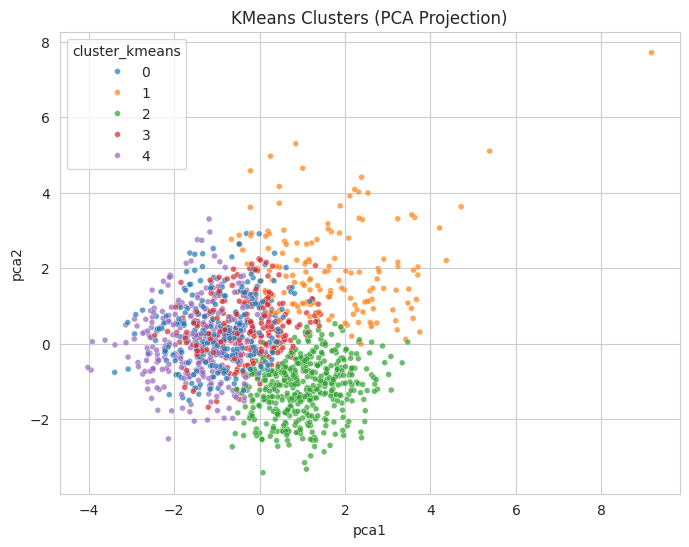

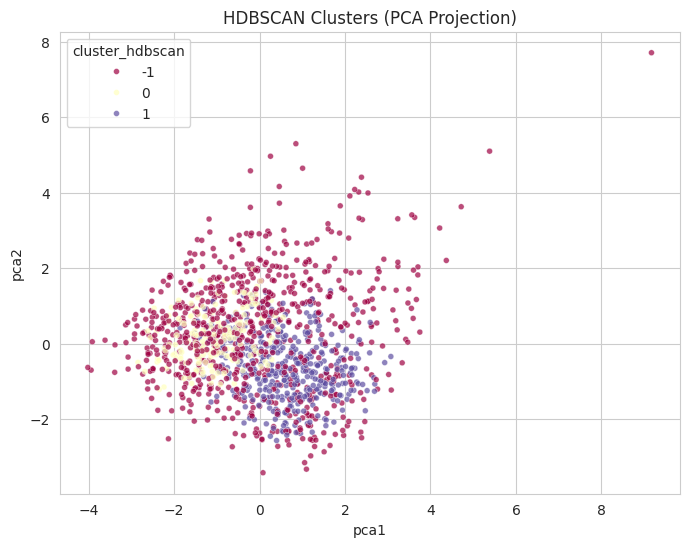

KMeans clusters: {2: 426, 4: 295, 3: 245, 0: 224, 1: 150}
DBSCAN clusters: {0: 622, -1: 380, 2: 333, 1: 5}
HDBSCAN clusters: {-1: 756, 1: 408, 0: 176}


In [40]:
# ==============================
# UNSUPERVISED LEARNING (No column names in input)
# ==============================
from sklearn.cluster import KMeans, DBSCAN
import hdbscan
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Use only the selected numeric features
features = [
    "order_value_INR","delivery_time_minutes","distance_km",
    "Delivery_person_Ratings","Delivery_person_Age",
    "hour_sin","hour_cos","log_order_value","place_encoded"
]

# Create X and scale it
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[features])

# ✅ Drop column names — now a pure NumPy array
X_matrix = np.array(X_scaled)

# ---- 1. KMeans ----
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
df["cluster_kmeans"] = kmeans.fit_predict(X_matrix)

# ---- 2. DBSCAN ----
dbscan = DBSCAN(eps=1.5, min_samples=12)
df["cluster_dbscan"] = dbscan.fit_predict(X_matrix)

# ---- 3. HDBSCAN ----
hdb = hdbscan.HDBSCAN(min_cluster_size=25, metric='euclidean')
df["cluster_hdbscan"] = hdb.fit_predict(X_matrix)

# ---- PCA for visualization ----
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_matrix)
df["pca1"], df["pca2"] = X_pca[:,0], X_pca[:,1]

# ---- Quick visualizations ----
plt.figure(figsize=(8,6))
sns.scatterplot(x="pca1", y="pca2", hue=df["cluster_kmeans"], palette="tab10", s=18, alpha=0.7, data=df)
plt.title("KMeans Clusters (PCA Projection)")
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(x="pca1", y="pca2", hue=df["cluster_hdbscan"], palette="Spectral", s=18, alpha=0.7, data=df)
plt.title("HDBSCAN Clusters (PCA Projection)")
plt.show()

# ---- Cluster counts ----
print("KMeans clusters:", df["cluster_kmeans"].value_counts().to_dict())
print("DBSCAN clusters:", df["cluster_dbscan"].value_counts().to_dict())
print("HDBSCAN clusters:", df["cluster_hdbscan"].value_counts().to_dict())


Training models for cluster_kmeans

🌲 Random Forest Results:
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        56
           1       0.78      0.92      0.84        38
           2       0.98      0.93      0.96       106
           3       0.95      0.92      0.93        61
           4       0.94      1.00      0.97        74

    accuracy                           0.94       335
   macro avg       0.93      0.94      0.93       335
weighted avg       0.95      0.94      0.94       335


🔥 XGBoost Results:
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        56
           1       0.88      0.92      0.90        38
           2       0.98      0.96      0.97       106
           3       0.95      0.93      0.94        61
           4       0.95      1.00      0.97        74

    accuracy                           0.96       335
   macro avg       0.95      0.95      0.95      

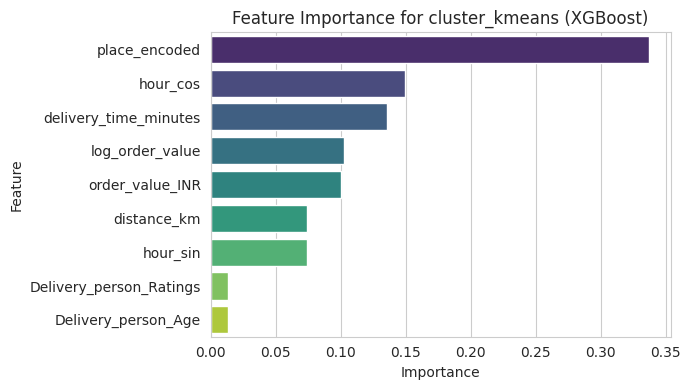


Training models for cluster_hdbscan

🌲 Random Forest Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00       102

    accuracy                           1.00       146
   macro avg       1.00      1.00      1.00       146
weighted avg       1.00      1.00      1.00       146


🔥 XGBoost Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        44
           1       1.00      1.00      1.00       102

    accuracy                           1.00       146
   macro avg       1.00      1.00      1.00       146
weighted avg       1.00      1.00      1.00       146

[LightGBM] [Info] Number of positive: 306, number of negative: 132
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 552
[

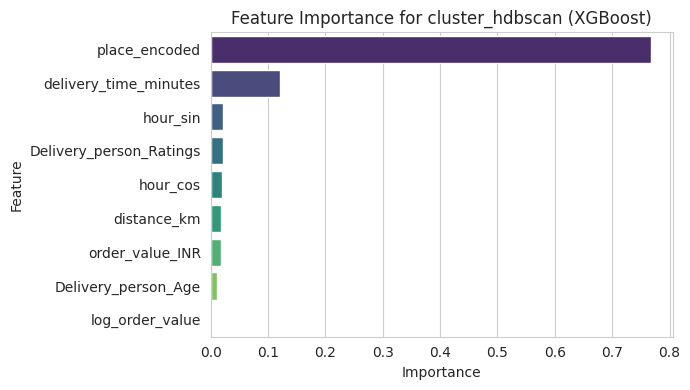

In [41]:
# Features used
features = [
    "order_value_INR","delivery_time_minutes","distance_km",
    "Delivery_person_Ratings","Delivery_person_Age",
    "hour_sin","hour_cos","log_order_value","place_encoded"
]
X = df[features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ---- TARGETS ----
# We'll train two classifiers: one for KMeans, one for HDBSCAN clusters
targets = {
    "cluster_kmeans": df["cluster_kmeans"],
    "cluster_hdbscan": df["cluster_hdbscan"]
}

for target_name, y in targets.items():
    print(f"\n==============================\nTraining models for {target_name}\n==============================")

    # Remove any -1 labels (noise) for HDBSCAN
    mask = y != -1
    X_sel, y_sel = X_scaled[mask], y[mask]

    X_train, X_test, y_train, y_test = train_test_split(X_sel, y_sel, test_size=0.25, random_state=42, stratify=y_sel)

    # ------------------------------
    # 1️⃣ Random Forest
    rf = RandomForestClassifier(n_estimators=300, max_depth=10, random_state=42, n_jobs=-1)
    rf.fit(X_train, y_train)
    rf_pred = rf.predict(X_test)
    print("\n🌲 Random Forest Results:")
    print(classification_report(y_test, rf_pred))

    # ------------------------------
    # 2️⃣ XGBoost
    xgb_clf = xgb.XGBClassifier(
        n_estimators=400, max_depth=8, learning_rate=0.05,
        subsample=0.8, colsample_bytree=0.8, random_state=42,
        eval_metric='mlogloss'
    )
    xgb_clf.fit(X_train, y_train)
    xgb_pred = xgb_clf.predict(X_test)
    print("\n🔥 XGBoost Results:")
    print(classification_report(y_test, xgb_pred))

    # ------------------------------
    # 3️⃣ LightGBM
    lgb_clf = lgb.LGBMClassifier(
        n_estimators=400, learning_rate=0.05, num_leaves=32, random_state=42
    )
    lgb_clf.fit(X_train, y_train)
    lgb_pred = lgb_clf.predict(X_test)
    print("\n⚡ LightGBM Results:")
    print(classification_report(y_test, lgb_pred))

    # ------------------------------
    # 4️⃣ CatBoost
    cat_clf = CatBoostClassifier(iterations=300, learning_rate=0.05, depth=8, verbose=False, random_seed=42)
    cat_clf.fit(X_train, y_train)
    cat_pred = cat_clf.predict(X_test)
    print("\n🐈 CatBoost Results:")
    print(classification_report(y_test, cat_pred))

    # ------------------------------
    # Feature importance (XGBoost example)
    imp = pd.DataFrame({
        "Feature": features,
        "Importance": xgb_clf.feature_importances_
    }).sort_values(by="Importance", ascending=False)

    plt.figure(figsize=(7,4))
    sns.barplot(x="Importance", y="Feature", data=imp, palette="viridis")
    plt.title(f"Feature Importance for {target_name} (XGBoost)")
    plt.tight_layout()
    plt.show()

In [42]:
# Snippet A: Predict clusters (using your trained XGBoost model) and plot on an India map with Plotly
# Assumes `df`, `features`, `scaler`, and `xgb_clf` are in memory from prior cells.

# 1) Create X array the same way as training (scale)
X_all = df[features].fillna(0).copy()
X_scaled_all = scaler.transform(X_all)  # scaler from training

# 2) Predict using the XGBoost classifier you trained for the chosen target (e.g., cluster_kmeans model)
# If you trained separate classifiers for KMeans and HDBSCAN, pick the appropriate one here (xgb_clf_kmeans or xgb_clf_hdbscan).
predicted_labels = xgb_clf.predict(X_scaled_all)  # integer labels

# Optional: if label encoder was used for cluster targets, decode (if you encoded them earlier)
# For clusters we usually have integer labels already; we'll just attach them.
df["predicted_cluster_xgb"] = predicted_labels.astype(int)

# 3) Quick sanity: how many predicted clusters
print("Predicted cluster counts:\n", df["predicted_cluster_xgb"].value_counts())

# 4) Plot: Plotly scatter_geo focused on India
# Use size for order_value and color for predicted cluster
size_series = np.clip(df["order_value_INR"].fillna(0) / 200, 2, 12)  # scale size for visibility

fig = px.scatter_geo(
    df,
    lat="Delivery_location_latitude",
    lon="Delivery_location_longitude",
    color=df["predicted_cluster_xgb"].astype(str),        # color by predicted cluster (string for discrete legend)
    size=size_series,
    hover_name="_approx_place",
    hover_data={
        "order_value_INR": True,
        "delivery_time_minutes": True,
        "predicted_cluster_xgb": True
    },
    title="🌍 Predicted Clusters (XGBoost) — Delivery Locations across India",
    scope="asia",
    height=700,
)

fig.update_geos(
    showcountries=True, showland=True,
    landcolor="rgb(240,240,240)",
    countrycolor="rgb(200,200,200)",
    lonaxis_range=[68,98],
    lataxis_range=[6,38],
)

fig.update_layout(margin=dict(l=0,r=0,t=60,b=0), legend_title_text="Pred Cluster")
fig.show()

# 5) Optional: create a faceted view by place_type (smaller subgroup maps)
# Example: filter a place_type and plot only that subset
# subset = df[df["place_type"] == "Town"]
# px.scatter_geo(subset, lat="Delivery_location_latitude", lon="Delivery_location_longitude", color="predicted_cluster_xgb").show()


Predicted cluster counts:
 predicted_cluster_xgb
1    871
0    469
Name: count, dtype: int64


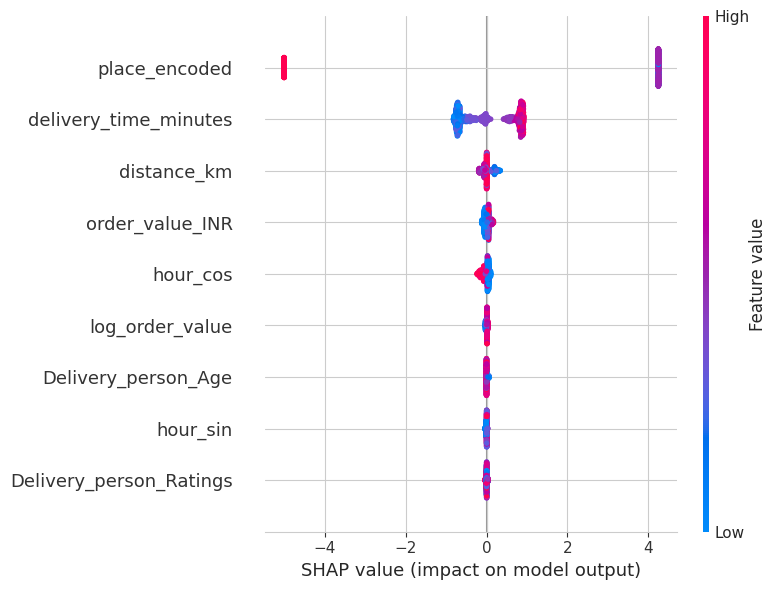

Top SHAP features: ['place_encoded', 'delivery_time_minutes', 'distance_km']


<Figure size 800x500 with 0 Axes>

<Figure size 700x500 with 0 Axes>

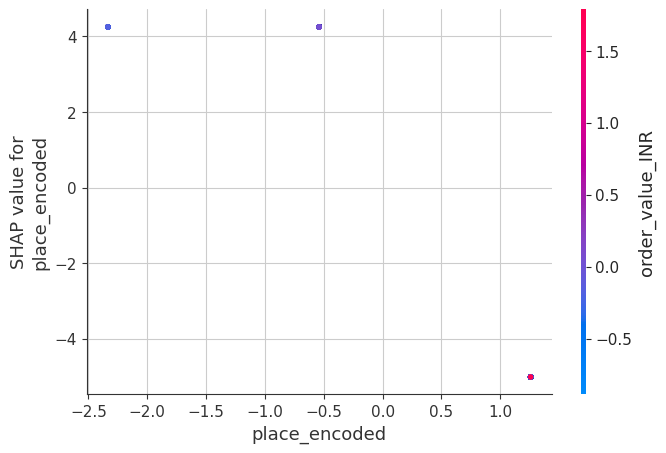

<Figure size 800x500 with 0 Axes>

<Figure size 700x500 with 0 Axes>

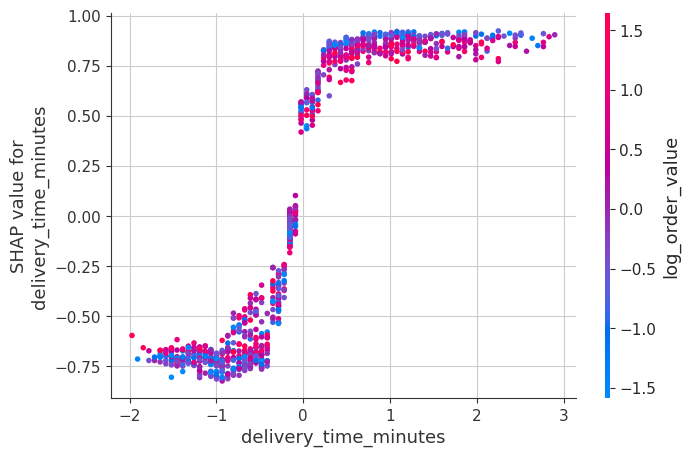

<Figure size 800x500 with 0 Axes>

<Figure size 700x500 with 0 Axes>

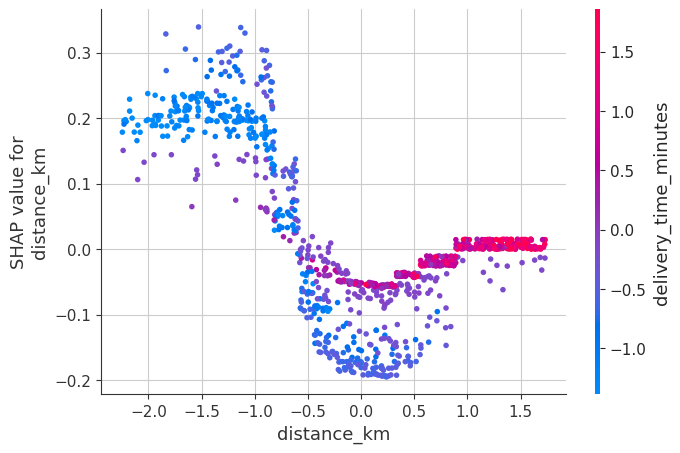

SHAP artifacts saved: summary PNG(s), dependence PNG(s), and force_plot HTML.


<Figure size 800x500 with 0 Axes>

In [43]:
# Snippet B: SHAP explainability for XGBoost classifier
# Installs, imports, compute SHAP values, and generate plots.
# Assumes xgb_clf (the trained XGBoost model), scaler, X_all, and df are present.

# 0) Install shap if needed (uncomment if not installed)
# !pip install -q shap

import shap

# 1) Prepare a sample for SHAP (we will use a stratified sample across predicted clusters to be representative)
sample_size = min(1000, len(df))
# stratified by predicted labels (if many classes, ensure representation)
sample_idx = df.groupby("predicted_cluster_xgb", group_keys=False).apply(
    lambda x: x.sample(n=max(1, int(sample_size * len(x) / len(df))), random_state=42)
).index
X_shap = X_all.loc[sample_idx].fillna(0)
X_shap_scaled = scaler.transform(X_shap)  # same scaler used at training

# 2) Build SHAP Explainer for tree model
explainer = shap.TreeExplainer(xgb_clf)  # fast for tree models

# 3) Compute SHAP values (multiclass returns list of arrays - one per class)
shap_values = explainer.shap_values(X_shap_scaled)  # list of arrays, shape (n_classes, n_samples, n_features) OR array for binary

# For convenience create a DataFrame of feature names (for plotting labels)
feature_names = features.copy()

# 4) SHAP summary plots
# If multiclass (shap_values is list), we'll plot per class and also aggregated importance.
if isinstance(shap_values, list):
    n_classes = len(shap_values)
    print(f"Multiclass SHAP detected with {n_classes} classes — plotting per-class summary (one figure per class).")
    for cls_idx in range(n_classes):
        plt.figure(figsize=(8,6))
        # shap.summary_plot accepts numpy arrays; pass features as array or DataFrame
        shap.summary_plot(shap_values[cls_idx], X_shap_scaled, feature_names=feature_names, show=True, plot_size=(8,6))
        plt.title(f"SHAP summary for class {cls_idx}")
        plt.tight_layout()
        # Optionally save
        plt.savefig(f"/content/shap_summary_class_{cls_idx}.png", bbox_inches="tight", dpi=150)
        plt.clf()
else:
    # Binary / single output
    plt.figure(figsize=(8,6))
    shap.summary_plot(shap_values, X_shap_scaled, feature_names=feature_names, show=True, plot_size=(8,6))
    plt.title("SHAP summary")
    plt.savefig("/content/shap_summary.png", bbox_inches="tight", dpi=150)
    plt.clf()

# 5) Dependence plot for key features (pick top 3 features from mean(|SHAP|) importance)
# We compute mean absolute shap importance across classes (if multiclass)
if isinstance(shap_values, list):
    # average absolute shap across classes
    abs_mean = np.mean([np.abs(sv).mean(axis=0) for sv in shap_values], axis=0)
else:
    abs_mean = np.abs(shap_values).mean(axis=0)

# get top features
top_idx = np.argsort(abs_mean)[::-1][:3]
top_features = [feature_names[i] for i in top_idx]
print("Top SHAP features:", top_features)

# For dependence plots use the explainer and shap.dependence_plot on the sampled data
for feat in top_features:
    plt.figure(figsize=(7,5))
    # shap.dependence_plot accepts raw feature index or name; use the scaled inputs and feature names
    shap.dependence_plot(feat, shap_values if not isinstance(shap_values, list) else shap_values[0], X_shap_scaled,
                         feature_names=feature_names, show=True)
    plt.title(f"SHAP dependence: {feat}")
    plt.savefig(f"/content/shap_dependence_{feat}.png", bbox_inches="tight", dpi=150)
    plt.clf()

# 6) SHAP force plot for one sample (interactive)
# Choose a single sample index (from sample_idx) to inspect (e.g., the first)
sample_local_index = 0
if isinstance(shap_values, list):
    # pick shap values for class 0 for force; you can pick class corresponding to predicted label
    sv0 = shap_values[0][sample_local_index]
else:
    sv0 = shap_values[sample_local_index]

# Convert scaled sample back to a DataFrame with feature names for readability in force_plot
sample_display = pd.DataFrame([X_shap_scaled[sample_local_index]], columns=feature_names)
# HTML interactive force plot (renders in Colab)
shap.initjs()
force_html = shap.force_plot(explainer.expected_value if not isinstance(shap_values, list) else explainer.expected_value[0],
                            sv0, sample_display, matplotlib=False)
# Save interactive HTML
shap.save_html("/content/shap_force_plot_sample0.html", force_html)
print("SHAP artifacts saved: summary PNG(s), dependence PNG(s), and force_plot HTML.")


In [44]:
# =========================================
# SAVE FINAL PROJECT FILE
# =========================================

import os
import pandas as pd

# Directory for saving
OUT_DIR = "/content/eda_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

# Select the key columns you want to preserve
save_cols = [
    "ID", "Delivery_person_ID", "Delivery_person_Age", "Delivery_person_Ratings",
    "Restaurant_latitude", "Restaurant_longitude",
    "Delivery_location_latitude", "Delivery_location_longitude",
    "Order_Date", "Time_Orderd",
    "order_value_INR", "delivery_time_minutes", "status",
    "distance_km", "_approx_place", "place_type",
    # Engineered features
    "hour_sin", "hour_cos", "log_order_value", "place_encoded",
    # Cluster & model outputs
    "cluster_kmeans", "cluster_dbscan", "cluster_hdbscan",
    "predicted_cluster_xgb", "pca1", "pca2"
]

# Filter for columns that actually exist (in case some weren’t created)
save_cols = [c for c in save_cols if c in df.columns]

# Final dataframe to save
final_df = df[save_cols].copy()

# Save as CSV
final_path = os.path.join(OUT_DIR, "india_geo_clustering_final.csv")
final_df.to_csv(final_path, index=False)

print(f"✅ Final dataset saved successfully:\n{final_path}")
print(f"Rows: {len(final_df)}, Columns: {len(final_df.columns)}")
final_df.head()

✅ Final dataset saved successfully:
/content/eda_outputs/india_geo_clustering_final.csv
Rows: 1340, Columns: 26


,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,...,hour_sin,hour_cos,log_order_value,place_encoded,cluster_kmeans,cluster_dbscan,cluster_hdbscan,predicted_cluster_xgb,pca1,pca2
0,ORD0001,DP0018,35,3.7,19.187136,73.253706,19.143831,73.147786,2024-08-18,14:41:57,...,-0.500000,-0.866025,6.390241,1,2,0,1,1,1.208014,-0.348799
1,ORD0002,DP0370,23,3.6,28.422697,76.942452,28.391331,76.811696,2024-12-01,14:44:44,...,-0.500000,-0.866025,5.945421,1,2,0,1,1,1.298450,-1.423334
2,ORD0003,DP0099,26,4.3,13.142132,77.765237,13.194121,77.882152,2024-11-19,19:01:41,...,-0.965926,0.258819,6.495266,1,2,0,1,1,2.230785,-0.651576
3,ORD0004,DP0378,38,5.0,12.915568,77.669159,13.013351,77.675551,2024-03-17,20:02:52,...,-0.866025,0.500000,7.107425,1,1,-1,-1,1,2.662828,0.926819
4,ORD0005,DP0305,22,4.4,18.658715,73.765779,18.751649,73.714412,2025-04-27,22:40:52,...,-0.500000,0.866025,5.880533,1,2,0,-1,1,0.740897,-0.715023


In [45]:
from google.colab import drive
drive.mount('/content/drive')
!cp /content/eda_outputs/india_geo_clustering_final.csv /content/drive/MyDrive/

Mounted at /content/drive


In [48]:
!pip install streamlit pandas numpy scikit-learn xgboost plotly pydeck matplotlib seaborn joblib
# Optional: pip install hdbscan shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 49.9 MB/s eta 0:00:00


In [51]:
!streamlit run app.py

Usage: streamlit run [OPTIONS] TARGET [ARGS]...
Try 'streamlit run --help' for help.

Error: Invalid value: File does not exist: app.py


In [73]:


# app.py
# Streamlit dashboard for India geospatial clustering project
# Save as app.py and run with: streamlit run app.py
# Requirements (pip): streamlit pandas numpy scikit-learn xgboost lightgbm plotly pydeck folium matplotlib seaborn joblib
# Optional: hdbscan shap

import streamlit as st
st.set_page_config(layout="wide", page_title="India Geo Clustering Dashboard", page_icon="📦")

import pandas as pd
import numpy as np
import pydeck as pdk
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import os
import io
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb

# Try import optional libs
try:
    import hdbscan
    HDBSCAN_AVAILABLE = True
except Exception:
    HDBSCAN_AVAILABLE = False

try:
    import shap
    SHAP_AVAILABLE = True
except Exception:
    SHAP_AVAILABLE = False

# -------------------------
# Helpers
# -------------------------
@st.cache_data
def load_data(uploaded_file=None, path="/content/eda_outputs/india_geo_clustering_final.csv"):
    if uploaded_file is not None:
        df = pd.read_csv(uploaded_file, parse_dates=["Order_Date"], low_memory=False)
    else:
        if os.path.exists(path):
            df = pd.read_csv(path, parse_dates=["Order_Date"], low_memory=False)
        else:
            st.error(f"Default dataset not found at {path}. Please upload CSV.")
            return None
    # Basic typing
    for col in ["order_value_INR","delivery_time_minutes","Delivery_person_Ratings","Delivery_person_Age","distance_km"]:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors="coerce")
    if "Time_Orderd" in df.columns:
        try:
            df["Order_Hour"] = pd.to_datetime(df["Time_Orderd"], format="%H:%M:%S", errors="coerce").dt.hour
        except Exception:
            df["Order_Hour"] = pd.NA
    # engineered features if missing
    if "log_order_value" not in df.columns:
        df["log_order_value"] = np.log1p(df["order_value_INR"].fillna(0))
    if "hour_sin" not in df.columns:
        df["Order_Hour"].fillna(df["Order_Hour"].mode()[0], inplace=True)
        df["hour_sin"] = np.sin(2 * np.pi * df["Order_Hour"].fillna(0) / 24)
        df["hour_cos"] = np.cos(2 * np.pi * df["Order_Hour"].fillna(0) / 24)
    if "place_type" not in df.columns:
        df["place_type"] = df.get("_approx_place", "Unknown")
    return df

@st.cache_data
def get_kmeans(X, k, random_state=42):
    km = KMeans(n_clusters=k, random_state=random_state, n_init=10)
    labels = km.fit_predict(X)
    return km, labels

@st.cache_data
def get_dbscan(X, eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(X)
    return db, labels

@st.cache_data
def get_hdbscan(X, min_cluster_size):
    if not HDBSCAN_AVAILABLE:
        return None, np.array([-1]*len(X))
    hdb = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, metric='euclidean')
    labels = hdb.fit_predict(X)
    return hdb, labels

# -------------------------
# Sidebar controls
# -------------------------
st.sidebar.header("Dataset & Controls")
uploaded = st.sidebar.file_uploader("Upload final CSV (optional)", type=["csv"])
df = load_data(uploaded)

if df is None:
    st.stop()

st.sidebar.markdown("**Quick filters**")
place_filter = st.sidebar.multiselect("Place type", options=df["place_type"].unique().tolist(), default=df["place_type"].unique().tolist())
status_filter = st.sidebar.multiselect("Order status", options=df["status"].unique().tolist(), default=df["status"].unique().tolist())
date_min = df["Order_Date"].min()
date_max = df["Order_Date"].max()
date_range = st.sidebar.date_input("Order Date range", value=(date_min, date_max), min_value=date_min, max_value=date_max)

# Clustering controls
st.sidebar.markdown("---")
st.sidebar.header("Clustering controls")
algo = st.sidebar.selectbox("Unsupervised algorithm", options=["KMeans", "DBSCAN", "HDBSCAN (optional)"])
k_clusters = st.sidebar.slider("KMeans: # clusters", min_value=2, max_value=12, value=5)
db_eps = st.sidebar.slider("DBSCAN: eps (scaled)", min_value=0.2, max_value=3.0, value=1.5, step=0.1)
db_min_samples = st.sidebar.slider("DBSCAN: min_samples", 3, 50, 12)
hdb_min_cluster_size = st.sidebar.slider("HDBSCAN: min_cluster_size", 5, 100, 25)

# Model controls
st.sidebar.markdown("---")
st.sidebar.header("Supervised model")
train_supervised = st.sidebar.checkbox("Train XGBoost to predict clusters", value=True)
train_test_split = st.sidebar.slider("Train/Test split (%)", 10, 50, 25)

# SHAP toggle
st.sidebar.markdown("---")
run_shap = st.sidebar.checkbox("Compute SHAP for XGBoost (heavy)", value=False)
if run_shap and not SHAP_AVAILABLE:
    st.sidebar.warning("SHAP not installed. Install `shap` to enable.")

# Export
st.sidebar.markdown("---")
if st.sidebar.button("Save current dataset (CSV)"):
    out_dir = "streamlit_outputs"
    os.makedirs(out_dir, exist_ok=True)
    out_path = os.path.join(out_dir, "india_geo_clustering_final_streamlit.csv")
    df.to_csv(out_path, index=False)
    st.sidebar.success(f"Saved CSV to {out_path}")

# -------------------------
# Data filtering
# -------------------------
mask = df["place_type"].isin(place_filter) & df["status"].isin(status_filter) & (df["Order_Date"] >= pd.to_datetime(date_range[0])) & (df["Order_Date"] <= pd.to_datetime(date_range[1]))
df_f = df[mask].copy()
st.title("📦 India Geo Clustering — Executive Dashboard")
st.markdown("Interactive dashboard to explore geospatial clusters, model predictions and feature explainability.")

# -------------------------
# Top KPIs
# -------------------------
col1, col2, col3, col4 = st.columns(4)
col1.metric("Orders (shown)", f"{len(df_f):,}")
col2.metric("Avg Order Value (₹)", f"{df_f['order_value_INR'].mean():.0f}")
col3.metric("Avg Delivery Time (min)", f"{df_f['delivery_time_minutes'].mean():.0f}")
col4.metric("Delivered (%)", f"{(df_f['status']=='Delivered').mean()*100:.1f}%")

# -------------------------
# Left: Map and Map Controls
# -------------------------
map_col, right_col = st.columns((2,1))

with map_col:
    st.subheader("India Map — deliveries")
    st.markdown("Pan, zoom, and inspect points. Use clustering controls in the sidebar to recompute clusters.")
    # Prepare features for clustering
    features = [
        "order_value_INR","delivery_time_minutes","distance_km",
        "Delivery_person_Ratings","Delivery_person_Age",
        "hour_sin","hour_cos","log_order_value"
    ]
    # If place_encoded exists, use it; otherwise create temporary encoding
    if "place_encoded" in df_f.columns:
        fe = features + ["place_encoded"]
    else:
        le = LabelEncoder()
        df_f["place_encoded_temp"] = le.fit_transform(df_f["place_type"].astype(str))
        fe = features + ["place_encoded_temp"]

    X = df_f[fe].fillna(0).values
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Run chosen clustering
    if algo == "KMeans":
        km, labels = get_kmeans(X_scaled, k_clusters)
    elif algo == "DBSCAN":
        db, labels = get_dbscan(X_scaled, db_eps, db_min_samples)
    else:
        if not HDBSCAN_AVAILABLE:
            st.error("HDBSCAN not available in this environment. Install hdbscan to enable.")
            labels = np.array([-1]*len(X_scaled))
        else:
            hdb, labels = get_hdbscan(X_scaled, hdb_min_cluster_size)

    # attach labels
    df_f["cluster_active"] = labels.astype(int)

    # Map colors for clusters
    uniq = np.unique(labels)
    n_uniq = len(uniq)
    # generate palette
    palette = px.colors.qualitative.Safe
    colors = [palette[i % len(palette)] for i in range(n_uniq)]

    # Pydeck view: use delivery locations
    map_data = df_f.dropna(subset=["Delivery_location_latitude","Delivery_location_longitude"]).copy()
    if map_data.empty:
        st.warning("No geo points available for selected filters.")
    else:
        # center
        center = [map_data["Delivery_location_latitude"].mean(), map_data["Delivery_location_longitude"].mean()]
        # add color mapping column
        label_to_color = {lab: colors[i % len(colors)] for i, lab in enumerate(uniq)}
        map_data["color"] = map_data["cluster_active"].map(label_to_color)

        # pydeck layer
        scatter = pdk.Layer(
            "ScatterplotLayer",
            data=map_data,
            get_position=["Delivery_location_longitude", "Delivery_location_latitude"],
            get_fill_color=["int( (cluster_active % 256) * 0.8 )", 100, 200, 180],
            get_radius=500,
            pickable=True,
            auto_highlight=True,
            radius_scale=10
        )

        tooltip = {"html": "<b>Order ID:</b> {ID} <br/> <b>Cluster:</b> {cluster_active} <br/> <b>Order Value:</b> ₹{order_value_INR} <br/> <b>Delivery Time:</b> {delivery_time_minutes} min <br/> <b>Place:</b> {_approx_place}", "style": {"color": "white"}}

        r = pdk.Deck(
            map_style="mapbox://styles/mapbox/light-v10",
            initial_view_state=pdk.ViewState(latitude=center[0], longitude=center[1], zoom=5, pitch=35),
            layers=[scatter],
            tooltip=tooltip
        )

        st.pydeck_chart(r)

    # Cluster summary table
    st.markdown("**Cluster summary (active clustering)**")
    cluster_summary = df_f.groupby("cluster_active").agg(
        orders=("ID","count"),
        avg_order_value=("order_value_INR","mean"),
        avg_delivery_time=("delivery_time_minutes","mean"),
        avg_distance_km=("distance_km","mean")
    ).round(1).reset_index().sort_values("orders", ascending=False)
    st.dataframe(cluster_summary, use_container_width=True)

# -------------------------
# Right: Charts and diagnostics
# -------------------------
with right_col:
    st.subheader("Diagnostics & Charts")
    # status breakdown
    fig1 = px.pie(df_f, names="status", title="Order status distribution")
    st.plotly_chart(fig1, use_container_width=True)

    # top places
    top_places = df_f["_approx_place"].value_counts().nlargest(8).reset_index()
    top_places.columns = ["place","count"]
    fig2 = px.bar(top_places, x="place", y="count", title="Top places (by orders)")
    st.plotly_chart(fig2, use_container_width=True)

    # hour-of-day heatmap (orders by hour)
    hour_counts = df_f["Order_Hour"].value_counts().sort_index()
    fig3 = px.bar(x=hour_counts.index, y=hour_counts.values, labels={"x":"Hour","y":"Orders"}, title="Orders by hour of day")
    st.plotly_chart(fig3, use_container_width=True)

# -------------------------
# Supervised: predict clusters (XGBoost) + SHAP
# -------------------------
st.markdown("---")
st.header("Supervised: Train XGBoost to predict current clusters")

if train_supervised:
    # target: cluster_active (drop noise -1)
    df_train = df_f[df_f["cluster_active"] != -1].copy()
    if df_train.empty:
        st.warning("No points available to train supervised model after filtering/noise removal.")
    else:
        X_sup = df_train[fe].fillna(0).values
        y_sup = df_train["cluster_active"].values
        # scale using global scaler for consistency
        scaler_sup = StandardScaler()
        X_sup_scaled = scaler_sup.fit_transform(X_sup)

        # split
        from sklearn.model_selection import train_test_split
        test_size = max(0.1, min(0.5, train_test_split/100)) if isinstance(train_test_split, int) else 0.25
        X_tr, X_te, y_tr, y_te = train_test_split(X_sup_scaled, y_sup, test_size=test_size, random_state=42, stratify=y_sup)

        # Train XGBoost
        st.info("Training XGBoost (multiclass)...")
        xgb_clf = xgb.XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.08, use_label_encoder=False, eval_metric="mlogloss", verbosity=0)
        xgb_clf.fit(X_tr, y_tr)
        y_pred = xgb_clf.predict(X_te)
        report = classification_report(y_te, y_pred, output_dict=True)
        st.subheader("Classification report (XGBoost)")
        st.dataframe(pd.DataFrame(report).T.style.format({"precision": "{:.2f}"}))

        # Feature importance plot
        fi = pd.DataFrame({"feature": fe, "importance": xgb_clf.feature_importances_}).sort_values("importance", ascending=False)
        fig_fi = px.bar(fi, x="importance", y="feature", orientation="h", title="XGBoost Feature Importance")
        st.plotly_chart(fig_fi, use_container_width=True)

        # Save the model if desired
        if st.button("Save XGBoost model"):
            os.makedirs("streamlit_outputs", exist_ok=True)
            joblib.dump((xgb_clf, scaler_sup, fe), "streamlit_outputs/xgb_clf_clusters.joblib")
            st.success("Saved XGBoost model to streamlit_outputs/xgb_clf_clusters.joblib")

        # SHAP
        if run_shap:
            if not SHAP_AVAILABLE:
                st.warning("SHAP library not installed. Please install shap to run SHAP explainability.")
            else:
                st.info("Computing SHAP values (this may take a moment)...")
                # sample for SHAP
                sample_idx = df_train.sample(min(500, len(df_train)), random_state=42).index
                X_shap = X_sup_scaled[[list(df_train.index).index(i) for i in sample_idx if i in df_train.index]]
                # compute explainer
                explainer = shap.TreeExplainer(xgb_clf)
                shap_values = explainer.shap_values(X_shap)
                # summary
                st.subheader("SHAP summary (saved images)")
                shap.summary_plot(shap_values, pd.DataFrame(X_shap, columns=fe), show=False)
                plt.tight_layout()
                plt.savefig("streamlit_outputs/shap_summary.png", dpi=150)
                st.image("streamlit_outputs/shap_summary.png", use_column_width=True)
                st.success("SHAP summary saved to streamlit_outputs/shap_summary.png")

# -------------------------
# Footer: download current colored map dataset
# -------------------------
st.markdown("---")
st.subheader("Export results")
colA, colB = st.columns(2)
with colA:
    if st.button("Download filtered dataset with clusters CSV"):
        to_save = df_f.copy()
        buf = io.StringIO()
        to_save.to_csv(buf, index=False)
        btn = st.download_button(label="Click to download CSV", data=buf.getvalue(), file_name="india_geo_clustering_filtered_clusters.csv", mime="text/csv")
with colB:
    if st.button("Download cluster summary CSV"):
        buf2 = io.StringIO()
        cluster_summary.to_csv(buf2, index=False)
        st.download_button("Download cluster summary", buf2.getvalue(), "cluster_summary.csv", "text/csv")

st.markdown("**Notes:** HDBSCAN & SHAP are optional libraries — if not installed the dashboard will still run for KMeans/DBSCAN and XGBoost model training. For production deployment, replace in-memory training with pre-saved models and add RBAC + secure hosting.")

2025-10-19 16:38:48.919 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-19 16:38:48.929 No runtime found, using MemoryCacheStorageManager
2025-10-19 16:38:48.934 No runtime found, using MemoryCacheStorageManager
2025-10-19 16:38:48.937 No runtime found, using MemoryCacheStorageManager
2025-10-19 16:38:48.941 No runtime found, using MemoryCacheStorageManager
2025-10-19 16:38:48.948 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-19 16:38:48.949 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-19 16:38:48.952 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-19 16:38:48.954 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-19 16:38:48.960 Thread 'MainThread': missing ScriptRunContext! Thi

DeltaGenerator()

In [74]:
%%writefile app.py

Overwriting app.py


In [75]:
!ls -l app.py

-rw-r--r-- 1 root root 1 Oct 19 16:38 app.py


In [77]:
!streamlit run app.py --server.port 8501 --server.headless true



2025-10-19 16:39:20.032 Port 8501 is already in use
